# **Covid data visualization on Indian map**





In [1]:
pip install plotly==4.14.3

     |████████████████████████████████| 13.2MB 205kB/s 
  Found existing installation: plotly 4.4.1
    Uninstalling plotly-4.4.1:
      Successfully uninstalled plotly-4.4.1


In [2]:
import pandas as pd
import plotly.express as px

In [5]:
df = pd.read_csv('covid_19_india.csv')

# Sort df by date
df = df.sort_values(by=['Date'])

#Print Head (the first 5 rows) and shape of the dataset
print(df.shape)
df.head()

(15086, 10)


,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed,State
0,1,2020-01-30,18:00,Kerala,1,0,0,0,1,KL
1,2,2020-01-31,18:00,Kerala,1,0,0,0,1,KL
2,3,2020-02-01,18:00,Kerala,2,0,0,0,2,KL
3,4,2020-02-02,18:00,Kerala,3,0,0,0,3,KL
4,5,2020-02-03,18:00,Kerala,3,0,0,0,3,KL


In [6]:
# If can observe that, When there are 0 cases in any state on a particular day,
# the corresponding rows for the dates and states missing in the dataset. So 
# data-preprocessing is required to add those rows.

#Fetch all stated from the dataset
states = df['State/UnionTerritory'].unique()

#Create a state->state code dictionary
stateDict = {}
for state in states:
  code = df[df['State/UnionTerritory'] == state]['State'].iloc[0]
  # print(str(state) + ', ' + str(code))
  stateDict[state] = code

#Fetch all unique dates in the dataset
dates = df['Date'].unique()

#Loop through all states
for state in stateDict.keys():
  #Fetch all rows in the dataset for the current state
  stateDf = df[df['State/UnionTerritory'] == state]
  
  #If number of rows for the current state is equal to number of unique dates,
  #then we can say that data exists for all dates for this particualar state.
  #So, no work here. Move to next state (loop).
  if stateDf.shape[0] == dates.shape[0]:
    continue
  
  for date in dates:
    #Loop through all dates and find out if any date is missing for the 
    #particular state.
    stateDateDf = stateDf[stateDf['Date'] == date]
    if stateDateDf.shape[0] == 0:
      #Since row for a particular date and a particular state is missing, create 
      #row and add it to the dataset.
      slNo = max(df['Sno']) + 1
      
      newRow = pd.DataFrame({'Sno':[slNo],
                    'Date': [date], 
                    'Time': '08:00', 
                    'State/UnionTerritory': [state],
                    'ConfirmedIndianNational':[0], 
                    'ConfirmedForeignNational':[0], 
                    'Cured':[0],
                    'Deaths':[0], 
                    'Confirmed':[0], 
                    'State': stateDict[state]})

      df = df.append(newRow)
print(df.tail())

     Sno        Date   Time  ... Deaths Confirmed State
0  19036  2021-04-27  08:00  ...      0         0    TG
0  19037  2021-04-28  08:00  ...      0         0    TG
0  19038  2021-04-29  08:00  ...      0         0    TG
0  19039  2021-04-30  08:00  ...      0         0    TG
0  19040  2021-05-01  08:00  ...      0         0    TG

[5 rows x 10 columns]


In [8]:
## Let's draw a choropleth map for confirmed COVID cases

fig = px.choropleth(
    df, #Data Frame
    
    #Pass the JSON file containing information of Indian map
    geojson="https://gist.githubusercontent.com/jbrobst/56c13bbbf9d97d187fea01ca62ea5112/raw/e388c4cae20aa53cb5090210a42ebb9b765c0a36/india_states.geojson",
    
    #"ST_NM" is the variable name for States in the JSON file. Indicate it as featureidkey to the function
    featureidkey='properties.ST_NM',
    
    #featureidkey needs to me mapped to 'State_name' in the data set
    locations='State/UnionTerritory',
    
    #Color code the map based on 'Confirmed' column in the data set
    color='Confirmed',
    
    #Heading of the hover text frame should be State_name
    hover_name="State/UnionTerritory",
    
    #Hove data frame should contain number of Confirmed, Deceased and Recovered cases
    hover_data = ["Confirmed", "Deaths", "Cured"],
    
    #Color code the map based on the Red color (Light red to dark red)
    # color_continuous_scale=px.colors.sequential.PuRd,
    color_continuous_scale='Viridis',
    
    #The toggle bar should be based on the date
    animation_frame="Date",
)

#We do not need whole world map. Only Indian map would suffice. Set it using following call
fig.update_geos(fitbounds="locations", visible=False)

#Display the map
fig.show()

# **COVID data visualization through Bar Graphs**

In [9]:
import matplotlib.pyplot as plt

In [10]:
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objects as go

In [11]:
import plotly.io as pio
pio.renderers.default = 'colab'

In [12]:
df1 = pd.read_csv('/content/covid.csv')
df1.head()

,Country/Region,Continent,Population,TotalCases,NewCases,TotalDeaths,NewDeaths,TotalRecovered,NewRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
0,USA,North America,3.311981e+08,5032179,NaN,162804.0,NaN,2576668.0,NaN,2292707.0,18296.0,15194.0,492.0,63139605.0,190640.0,Americas,USA
1,Brazil,South America,2.127107e+08,2917562,NaN,98644.0,NaN,2047660.0,NaN,771258.0,8318.0,13716.0,464.0,13206188.0,62085.0,Americas,BRA
2,India,Asia,1.381345e+09,2025409,NaN,41638.0,NaN,1377384.0,NaN,606387.0,8944.0,1466.0,30.0,22149351.0,16035.0,South-EastAsia,IND
3,Russia,Europe,1.459409e+08,871894,NaN,14606.0,NaN,676357.0,NaN,180931.0,2300.0,5974.0,100.0,29716907.0,203623.0,Europe,RUS
4,South Africa,Africa,5.938157e+07,538184,NaN,9604.0,NaN,387316.0,NaN,141264.0,539.0,9063.0,162.0,3149807.0,53044.0,Africa,ZAF


In [13]:
df2 = pd.read_csv('/content/covid_grouped.csv')
df2.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,AFG
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe,ALB
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa,DZA
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe,AND
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa,AGO


In [14]:
df1.columns

Index(['Country/Region', 'Continent', 'Population', 'TotalCases', 'NewCases',
       'TotalDeaths', 'NewDeaths', 'TotalRecovered', 'NewRecovered',
       'ActiveCases', 'Serious,Critical', 'Tot Cases/1M pop', 'Deaths/1M pop',
       'TotalTests', 'Tests/1M pop', 'WHO Region', 'iso_alpha'],
      dtype='object')

In [15]:
df1.drop(['NewRecovered', 'NewCases', 'NewDeaths'], axis=1, inplace=True)
df1.head()

,Country/Region,Continent,Population,TotalCases,TotalDeaths,TotalRecovered,ActiveCases,"Serious,Critical",Tot Cases/1M pop,Deaths/1M pop,TotalTests,Tests/1M pop,WHO Region,iso_alpha
0,USA,North America,3.311981e+08,5032179,162804.0,2576668.0,2292707.0,18296.0,15194.0,492.0,63139605.0,190640.0,Americas,USA
1,Brazil,South America,2.127107e+08,2917562,98644.0,2047660.0,771258.0,8318.0,13716.0,464.0,13206188.0,62085.0,Americas,BRA
2,India,Asia,1.381345e+09,2025409,41638.0,1377384.0,606387.0,8944.0,1466.0,30.0,22149351.0,16035.0,South-EastAsia,IND
3,Russia,Europe,1.459409e+08,871894,14606.0,676357.0,180931.0,2300.0,5974.0,100.0,29716907.0,203623.0,Europe,RUS
4,South Africa,Africa,5.938157e+07,538184,9604.0,387316.0,141264.0,539.0,9063.0,162.0,3149807.0,53044.0,Africa,ZAF


**A look good table**

In [16]:
from plotly.figure_factory import create_table
table = create_table(df1.head(10), colorscale='blues')
py.iplot(table)

**Country vs Total Cases bar chart**

In [17]:
df1.columns

Index(['Country/Region', 'Continent', 'Population', 'TotalCases',
       'TotalDeaths', 'TotalRecovered', 'ActiveCases', 'Serious,Critical',
       'Tot Cases/1M pop', 'Deaths/1M pop', 'TotalTests', 'Tests/1M pop',
       'WHO Region', 'iso_alpha'],
      dtype='object')

In [18]:
px.bar(df1.head(10), 
       x='Country/Region', 
       y='TotalCases', 
       color='TotalCases', 
       height=500, 
       hover_data=['Country/Region', 'Continent'])

**Country vs Total Cases bar chart**

In [19]:
px.bar(df1.head(10),
       x='Country/Region', 
       y='TotalDeaths', 
       color='TotalDeaths', 
       height=500, 
       hover_data=['Country/Region', 'Continent'])

**Country vs Total Recovered bar chart**

In [20]:
px.bar(df1.head(10), 
       x='Country/Region', 
       y='TotalRecovered', 
       color='TotalRecovered', 
       height=500, 
       hover_data=['Country/Region', 'Continent'])

**Country vs Total Tests bar chart**



In [21]:
px.bar(df1.head(10), 
       x='TotalTests', 
       y='Country/Region', 
       color='TotalTests', 
       orientation='h',
       height=500, 
       hover_data=['Country/Region', 'Continent'])

**Content vs Total tests bar chart**



In [22]:
px.bar(df1.head(10), 
       x='TotalTests', 
       y='Continent', 
       color='TotalTests', 
       orientation='h',
       height=500, 
       hover_data=['Country/Region', 'Continent'])

# **COVID data visualization through Bubble Charts**

In [23]:
df1.columns

Index(['Country/Region', 'Continent', 'Population', 'TotalCases',
       'TotalDeaths', 'TotalRecovered', 'ActiveCases', 'Serious,Critical',
       'Tot Cases/1M pop', 'Deaths/1M pop', 'TotalTests', 'Tests/1M pop',
       'WHO Region', 'iso_alpha'],
      dtype='object')

Continent Vs Total Cases

In [24]:
px.scatter(df1.head(50), 
           x='Continent', 
           y='TotalCases', 
           hover_data=['Country/Region', 'Continent'],
           color='TotalCases',
           size = 'TotalCases',
           size_max=80)

In [25]:
px.scatter(df1.head(50), 
           x='Continent', 
           y='TotalCases', 
           hover_data=['Country/Region', 'Continent'],
           color='TotalCases',
           size = 'TotalCases',
           size_max=80,
           log_y=True)

Continent Vs Total Tests

In [26]:
px.scatter(df1.head(50), 
           x='Continent', 
           y='TotalTests', 
           hover_data=['Country/Region', 'Continent'],
           color='TotalTests',
           size = 'TotalTests',
           size_max=80,
           log_y=True)

Continent Vs Total Deaths

In [27]:
px.scatter(df1.head(50), 
           x='Continent', 
           y='TotalDeaths', 
           hover_data=['Country/Region', 'Continent'],
           color='TotalDeaths',
           size = 'TotalDeaths',
           size_max=80,
           log_y=True)

Country Vs Total Cases

In [28]:
px.scatter(df1.head(30), 
           x='Country/Region', 
           y='TotalCases', 
           hover_data=['Country/Region', 'Continent'],
           color='Country/Region',
           size = 'TotalCases',
           size_max=80,
           log_y=True)

Country Vs Total Deaths

In [29]:
px.scatter(df1.head(10), 
           x='Country/Region', 
           y='TotalDeaths', 
           hover_data=['Country/Region', 'Continent'],
           color='Country/Region',
           size = 'TotalDeaths',
           size_max=80)

Country Vs Tests/1M population

In [30]:
px.scatter(df1.head(30), 
           x='Country/Region', 
           y='Tests/1M pop', 
           hover_data=['Country/Region', 'Continent'],
           color='Tests/1M pop',
           size = 'Tests/1M pop',
           size_max=80)

In [31]:
df1.columns

Index(['Country/Region', 'Continent', 'Population', 'TotalCases',
       'TotalDeaths', 'TotalRecovered', 'ActiveCases', 'Serious,Critical',
       'Tot Cases/1M pop', 'Deaths/1M pop', 'TotalTests', 'Tests/1M pop',
       'WHO Region', 'iso_alpha'],
      dtype='object')

Total Cases Vs Total Deaths

In [32]:
px.scatter(df1.head(30), 
           x='TotalCases', 
           y='TotalDeaths', 
           hover_data=['Country/Region', 'Continent'],
           color='TotalDeaths',
           size = 'TotalDeaths',
           size_max=80,
           log_x=True,
           log_y=True)

Total Tests Vs Total Cases

In [33]:
px.scatter(df1.head(30), 
           x='TotalTests', 
           y='TotalCases', 
           hover_data=['Country/Region', 'Continent'],
           color='TotalTests',
           size = 'TotalTests',
           size_max=80,
           log_x=True,
           log_y=True)

# **Advanced Data Visualization using Line Graph and Bar Graph (Dataset - 2)**

In [34]:
df2.columns

Index(['Date', 'Country/Region', 'Confirmed', 'Deaths', 'Recovered', 'Active',
       'New cases', 'New deaths', 'New recovered', 'WHO Region', 'iso_alpha'],
      dtype='object')

In [35]:
df2.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,AFG
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe,ALB
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa,DZA
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe,AND
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa,AGO


In [36]:
df2.tail()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
35151,2020-07-27,West Bank and Gaza,10621,78,3752,6791,152,2,0,Eastern Mediterranean,
35152,2020-07-27,Western Sahara,10,1,8,1,0,0,0,Africa,ESH
35153,2020-07-27,Yemen,1691,483,833,375,10,4,36,Eastern Mediterranean,YEM
35154,2020-07-27,Zambia,4552,140,2815,1597,71,1,465,Africa,ZMB
35155,2020-07-27,Zimbabwe,2704,36,542,2126,192,2,24,Africa,ZWE


Date Vs Confirmed (All Countries)

In [37]:
px.bar(df2,
       x='Date', 
       y='Deaths', 
       color='Deaths', 
       hover_data=['Confirmed','Date','Country/Region'], 
       height=400,
       log_y=False)

In [38]:
df_US = df2.loc[df2['Country/Region']=='US']
df_US.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
173,2020-01-22,US,1,0,0,1,0,0,0,Americas,USA
360,2020-01-23,US,1,0,0,1,0,0,0,Americas,USA
547,2020-01-24,US,2,0,0,2,1,0,0,Americas,USA
734,2020-01-25,US,2,0,0,2,0,0,0,Americas,USA
921,2020-01-26,US,5,0,0,5,3,0,0,Americas,USA


Date Vs Confirmed (US)

In [39]:
px.bar(df_US,
       x='Date', 
       y='Confirmed', 
       color='Confirmed', 
       hover_data=['Confirmed','Date','Country/Region'], 
       height=400,
       log_y=False)

Date Vs Deaths (US)

In [40]:
px.bar(df_US,
       x='Date', 
       y='Deaths', 
       color='Deaths', 
       hover_data=['Deaths','Date','Country/Region'], 
       height=400,
       log_y=False)

Date Vs Recovered (US)

In [41]:
px.bar(df_US,
       x='Date', 
       y='Recovered', 
       color='Recovered', 
       hover_data=['Recovered','Date','Country/Region'], 
       height=400,
       log_y=False)

In [42]:
px.line(df_US,
       x='Date', 
       y='Recovered', 
       height=400)

In [43]:
px.line(df_US,
       x='Date', 
       y='Confirmed', 
       height=400)

In [44]:
px.line(df_US,
       x='Date', 
       y='New cases', 
       height=400)

In [45]:
px.bar(df_US,
       x='Date', 
       y='New cases', 
       height=400)

Date Vs Confirmed (India)

In [46]:
df_India = df2.loc[df2['Country/Region'] == 'India']
df_India.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
79,2020-01-22,India,0,0,0,0,0,0,0,South-East Asia,IND
266,2020-01-23,India,0,0,0,0,0,0,0,South-East Asia,IND
453,2020-01-24,India,0,0,0,0,0,0,0,South-East Asia,IND
640,2020-01-25,India,0,0,0,0,0,0,0,South-East Asia,IND
827,2020-01-26,India,0,0,0,0,0,0,0,South-East Asia,IND


In [47]:
px.bar(df_India,
       x='Date', 
       y='Confirmed', 
       color='Confirmed', 
       hover_data=['Confirmed','Date','Country/Region'], 
       height=400,
       log_y=False)

Date Vs Confirmed (India)

In [48]:
px.bar(df_India,
       x='Date', 
       y='Deaths', 
       color='Deaths', 
       hover_data=['Deaths','Date','Country/Region'], 
       height=400,
       log_y=False)

Date Vs Deaths (India)

In [49]:
px.bar(df_India,
       x='Date', 
       y='Recovered', 
       color='Recovered', 
       hover_data=['Recovered','Date','Country/Region'], 
       height=400,
       log_y=False)

In [50]:
px.bar(df_India,
       x='Date', 
       y='New cases', 
       height=400)

In [51]:
px.line(df_India,
       x='Date', 
       y='New cases', 
       height=400)

In [52]:
px.line(df_India,
       x='Date', 
       y='Confirmed', 
       height=400)

In [53]:
px.scatter(df_US, 
           x='Confirmed', 
           y='Deaths', 
           height=400)

In [54]:
px.scatter(df_India, 
           x='Confirmed', 
           y='New cases', 
           height=400)

# **Represent Geographic Data as Chloropeth maps**

In [55]:
df2.columns

Index(['Date', 'Country/Region', 'Confirmed', 'Deaths', 'Recovered', 'Active',
       'New cases', 'New deaths', 'New recovered', 'WHO Region', 'iso_alpha'],
      dtype='object')

In [56]:
df2.head()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered,WHO Region,iso_alpha
0,2020-01-22,Afghanistan,0,0,0,0,0,0,0,Eastern Mediterranean,AFG
1,2020-01-22,Albania,0,0,0,0,0,0,0,Europe,ALB
2,2020-01-22,Algeria,0,0,0,0,0,0,0,Africa,DZA
3,2020-01-22,Andorra,0,0,0,0,0,0,0,Europe,AND
4,2020-01-22,Angola,0,0,0,0,0,0,0,Africa,AGO


In [57]:
px.choropleth(df2,
              locations='iso_alpha',
              color='Confirmed',
              hover_name='Country/Region',
              color_continuous_scale='Blues',
              animation_frame='Date')

In [58]:
px.choropleth(df2,
              locations='iso_alpha',
              color='Deaths',
              hover_name='Country/Region',
              color_continuous_scale='Viridis',
              animation_frame='Date')

Ortographic Projection: Total Death

In [59]:
px.choropleth(df2,
              locations='iso_alpha',
              color='Deaths',
              hover_name='Country/Region',
              color_continuous_scale='Viridis',
              animation_frame='Date',
              projection='orthographic')

Equirectangular Projection: Total Recovered

In [60]:
px.choropleth(df2,
              locations='iso_alpha',
              color='Recovered',
              hover_name='Country/Region',
              color_continuous_scale='Greens',
              animation_frame='Date',
              projection='natural earth')

# **Bar Graph Animation**

In [61]:
df2.columns

Index(['Date', 'Country/Region', 'Confirmed', 'Deaths', 'Recovered', 'Active',
       'New cases', 'New deaths', 'New recovered', 'WHO Region', 'iso_alpha'],
      dtype='object')

In [62]:
px.bar(df2,
       x='WHO Region',
       y='Confirmed',
       color='Confirmed',
       animation_frame='Date',
       hover_name='Country/Region')

In [63]:
px.bar(df2,
       x='WHO Region',
       y='New cases',
       color='New cases',
       animation_frame='Date',
       hover_name='Country/Region')

# **Text Visualization using word cloud**

In [64]:
from wordcloud import WordCloud

In [65]:
df3 = pd.read_csv('covid death.csv')
df3.head()

,Data as of,Start Week,End Week,State,Condition Group,Condition,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
0,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,0-24,122.0,NaN
1,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,25-34,596.0,NaN
2,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,35-44,1521.0,NaN
3,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,45-54,4186.0,NaN
4,08/30/2020,02/01/2020,08/29/2020,US,Respiratory diseases,Influenza and pneumonia,J09-J18,55-64,10014.0,NaN


In [66]:
df3.tail()

,Data as of,Start Week,End Week,State,Condition Group,Condition,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
12255,08/30/2020,02/01/2020,08/29/2020,YC,Coronavirus Disease 2019,COVID-19,U071,65-74,5024.0,NaN
12256,08/30/2020,02/01/2020,08/29/2020,YC,Coronavirus Disease 2019,COVID-19,U071,75-84,5381.0,NaN
12257,08/30/2020,02/01/2020,08/29/2020,YC,Coronavirus Disease 2019,COVID-19,U071,85+,4841.0,NaN
12258,08/30/2020,02/01/2020,08/29/2020,YC,Coronavirus Disease 2019,COVID-19,U071,Not stated,NaN,Counts less than 10 suppressed.
12259,08/30/2020,02/01/2020,08/29/2020,YC,Coronavirus Disease 2019,COVID-19,U071,All ages,20628.0,NaN


In [67]:
df3.groupby(['Condition']).count()

,Data as of,Start Week,End Week,State,Condition Group,ICD10_codes,Age Group,Number of COVID-19 Deaths,Flag
Condition,,,,,,,,,
Adult respiratory distress syndrome,540,540,540,540,540,540,540,272,268
All other conditions and causes (residual),540,540,540,540,540,540,540,363,177
Alzheimer disease,530,530,530,530,530,530,530,144,386
COVID-19,540,540,540,540,540,540,540,377,163
Cardiac arrest,520,520,520,520,520,520,520,219,301
Cardiac arrhythmia,540,540,540,540,540,540,540,192,348
Cerebrovascular diseases,530,530,530,530,530,530,530,187,343
Chronic lower respiratory diseases,540,540,540,540,540,540,540,229,311
Diabetes,540,540,540,540,540,540,540,276,264


Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Influenza and pneumonia Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Chronic lower respiratory diseases Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Adult respiratory distress syndrome Respiratory failure Respiratory failure Respirator

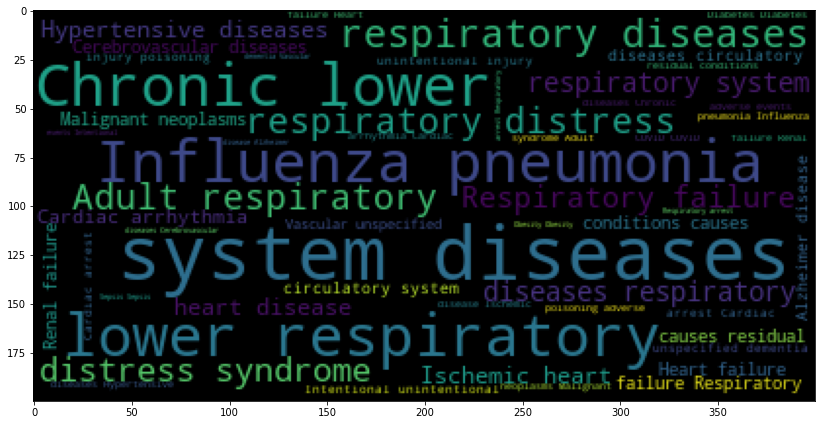

In [68]:
sentences = df3['Condition'].tolist()
sentenses_as_a_string = ' '.join(sentences)
print(sentenses_as_a_string)

plt.figure(figsize=(14,14))
plt.imshow(WordCloud().generate(sentenses_as_a_string))